In [1]:
import pickle
import sys
sys.path.insert(1, './functions/')
import os
from importlib import reload
import matplotlib.pyplot as plt
import numpy as np
from importlib import  reload
import pandas as pd
import pickle
from utility import create_folder

%matplotlib inline 

In [2]:
scale = 5
cm2inch = 0.39
ssmall_SIZE = 3*scale
SMALL_SIZE = 4*scale
MEDIUM_SIZE = 6*scale
BIGGER_SIZE = 8*scale
LINE_WIDTH = 2*2
plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize

plt.rc('axes', labelsize=SMALL_SIZE)    # fontsize of the x and y labels
plt.rc('figure', titlesize=MEDIUM_SIZE)  # fontsize of the figure title
plt.rc('axes', titlesize=MEDIUM_SIZE)     # fontsize of the axes title
plt.rc('lines', linewidth=LINE_WIDTH)


In [3]:
filename ='../data/run_data/piezo_models_results.pickle'

with open(filename, 'rb') as f:
    result_models = pickle.load(f)


from read_data import read_X_depth
matfile = '../data/piezo_data1.mat'
depth = 0
y = read_X_depth(matfile,depth,type ='df')
print(y.shape)

(391, 2824)


In [4]:
from read_data import read_n_neuron_depths
n_neuron_depths,n_frame_depths = read_n_neuron_depths(matfile,type ='df')




In [5]:
# recording_depths =[278,300,332,360,394,426,470,496]
# nn = dict()
# nn['depth(um)'] = recording_depths
# nn['n_neurons'] = n_neuron_depths.astype('int')
# nn['n_frames']  = n_frame_depths.astype('int')
# from tabulate import tabulate
# table = tabulate(nn, headers = nn.keys(),tablefmt = 'fancy_grid')
# print('Dataset1 (layer 5/6)')
# print(table)



In [6]:

def plot_exaple_trace(y,i,j,tw,xtick_gap = 20,ci=None, cj = None, figsize = (6,4)):
    fig,ax = plt.subplots(figsize = figsize)

    ax.plot(y[i,tw],color = ci,label ='Neuron i');
    ax.plot(y[j,tw],color = cj, label ='Neuron j');
    xticks = np.arange(0,len(tw)+1,3.86*xtick_gap)
    xticklabels = np.floor((tw[0]+xticks)/3.86).astype(int)
    ax.set_xticks(xticks)
    ax.set_xticklabels(xticklabels)
    ax.set_xlabel('Time (s)')
    ax.set_ylabel(r'Neural activity $(\Delta F/F)$')
    ax.set_title('Example neural traces')
    ax.legend()
    fig.tight_layout()
    plt.show()

def imshow_y(y,subtitle='', figsize = (6,4)):
    fig,ax = plt.subplots(figsize = figsize)
    im =ax.imshow(y,aspect='auto');
    fig.colorbar(im)
    xticks = np.arange(0,y.shape[1]+1,3.86*100)
    xticklabels = np.floor((xticks)/3.86).astype(int)
    ax.set_xticks(xticks)
    ax.set_xticklabels(xticklabels)
    ax.set_xlabel('Time (s)')
    ax.set_ylabel('Neuron')
    ax.set_title(r'Neural actvities ($\Delta F/F_0$)'+subtitle)



In [7]:
def imshow_y(y,subtitle='', figsize = (6,4), ymax = 1,savepath = None):
    fig,ax = plt.subplots(figsize = figsize)

    im =ax.imshow(y,aspect='auto', vmax = ymax);
    fig.colorbar(im)
    xticks = np.arange(0,y.shape[1]+1,3.86*100)
    xticklabels = np.floor((xticks)/3.86).astype(int)
    ax.set_xticks(xticks)
    ax.set_xticklabels(xticklabels)
    ax.set_xlabel('Time (s)')
    ax.set_ylabel('Neuron')
    ax.set_title(r'Neural actvities ($\Delta F/F_0$)'+subtitle)
    fig.tight_layout()
    if savepath is not None:
        filename ='imshow_y.pdf'
        savefile = os.path.join(savepath,filename)
        fig.savefig(savefile)
    plt.show()

def Sort_peak(y):
    peak_yi_timing = np.argmax(y,axis =1 )
    idx_sort = np.argsort(peak_yi_timing)
    y_sort = y[idx_sort,:]
    return y_sort,idx_sort


def plot_example_trace(y,i,j,k,tw,xtick_gap = 20,ci=None, cj = None,ck = None, figsize = (6,4), lw = 2,
                       savepath = None):
    fig,ax = plt.subplots(figsize = figsize, ncols=  1, nrows=  3)

    ax[0].plot(y[i,tw],color = ci,label ='Neuron i', lw = lw);
    ax[1].plot(y[j,tw],color = cj, label ='Neuron j',lw = lw);
    ax[2].plot(y[k,tw],color = ck, label ='Neuron j',lw = lw);
    xticks = np.arange(0,len(tw)+1,3.86*xtick_gap)
    xticklabels = np.floor((tw[0]+xticks)/3.86).astype(int)

    for i in range(3):
        ax[i].set_xticks(xticks)
        ax[i].set_xticklabels(xticklabels)
        # ax[i].set_ylabel(r'Neural activity $(\Delta F/F)$')
        
        # ax[i].legend()

    ax[1].set_ylabel(r' $\Delta F/F$')
    
    ax[0].set_title('Example neural traces')
    ax[2].set_xlabel('Time (s)')

    fig.tight_layout()
    if savepath is not None:
        filename ='example_trace.pdf'
        savefile = os.path.join(savepath,filename)
        fig.savefig(savefile)
    plt.show()

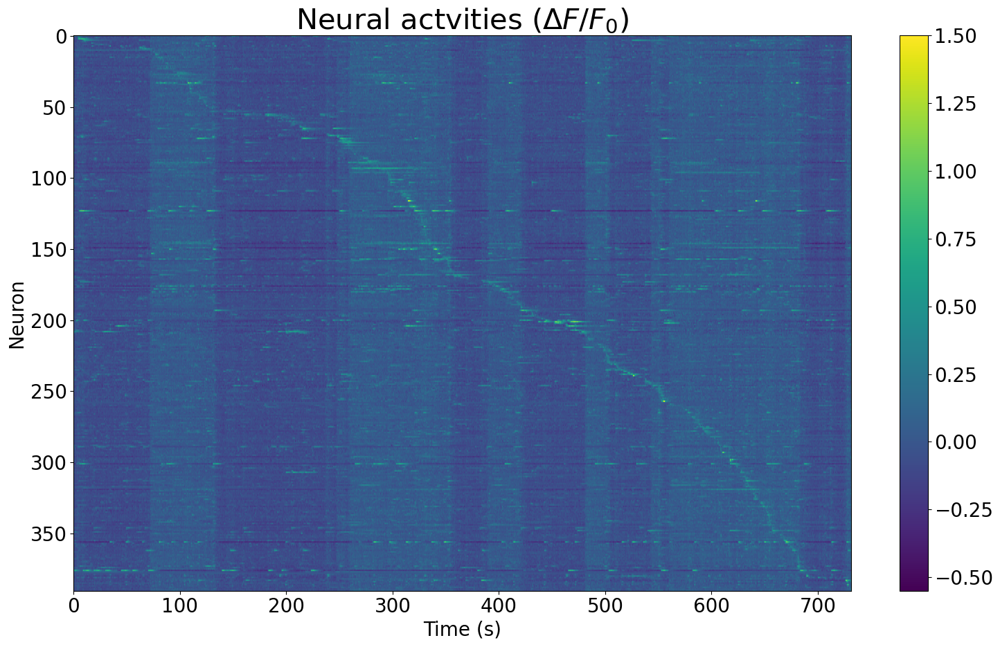

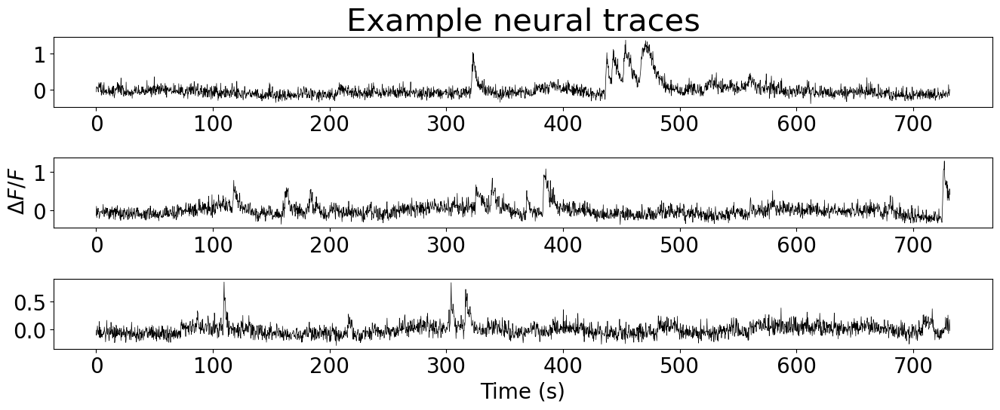

In [8]:
figsize_cm = (8, 5)
figsize = (figsize_cm[0]*scale*cm2inch,figsize_cm[1]*scale*cm2inch)
savepath = './figs/piezo_models'
create_folder(savepath)

y_sort,idx_sort = Sort_peak(y)
imshow_y(y_sort, figsize = figsize, ymax = 1.5, savepath = savepath)


figsize_cm = (7, 3)
figsize = (figsize_cm[0]*scale*cm2inch,figsize_cm[1]*scale*cm2inch)

plot_example_trace(y,1,3,300,tw = np.arange(0,y.shape[1]),xtick_gap = 100,
                  ci = 'k', cj = 'k', ck ='k',
                  figsize = figsize, lw =0.5, savepath = savepath)


In [9]:
import fun_models_class; reload(fun_models_class)
from fun_models_class import imshow_wxyq



def imshow_model_wxyq(models_results, model_name = 'pca', cmap ='RdBu_r', 
                      wmax = 1, xmax = 3, ymax = 8, ymin = 0, 
                      figsize = (15,5), savepath = None, title='PCA', 
                      y_sort_idx = None,xtick_s=False):
    model = models_results[model_name]


    W = model['W']
    x = model['X']
    yq = model['yq']
    
    if y_sort_idx is not None:
        W = W[y_sort_idx,:]

    imshow_wxyq(W,x, yq,  cmap =cmap, wmax = wmax, xmax = xmax, ymax = ymax, ymin = ymin,
                model_name =model_name,title = title, figsize = figsize, savepath = savepath,
                y_sort_idx = idx_sort,xtick_s = xtick_s)
    

sort yq


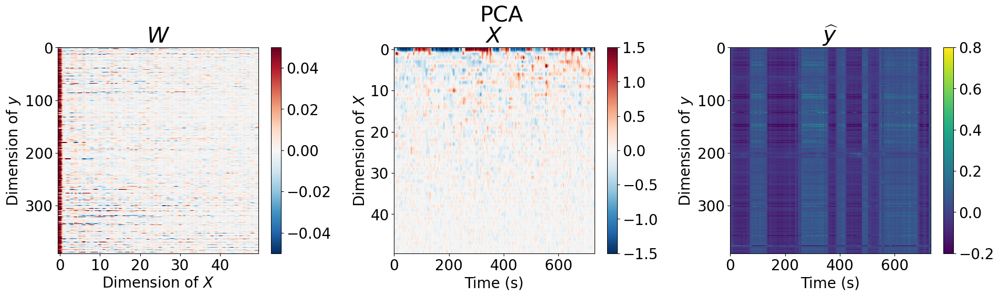

In [10]:
figsize_cm =(10,3)
figsize = (figsize_cm[0]*scale*cm2inch, figsize_cm[1]*scale*cm2inch)
ymax = 0.8
ymin = -0.2
xtick_s = True
imshow_model_wxyq(result_models,model_name = 'pca', wmax  =0.05, xmax = 1.5, ymin = ymin,ymax = ymax, cmap ='RdBu_r',
                  title ='PCA',figsize = figsize, savepath = savepath,
                  y_sort_idx=idx_sort,xtick_s = xtick_s)


sort yq


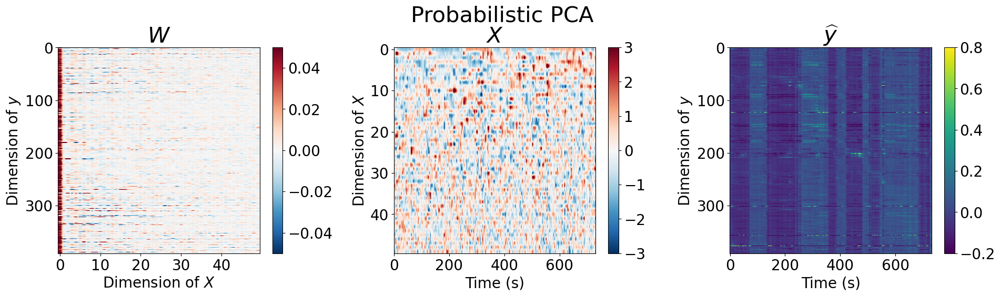

In [11]:
imshow_model_wxyq(result_models,model_name = 'mlpca', wmax  =0.05, xmax = 3, ymax = ymax, cmap ='RdBu_r', 
                  title ='Probabilistic PCA',figsize = figsize,  savepath = savepath,ymin = ymin,
                  y_sort_idx=idx_sort,xtick_s = xtick_s)

sort yq


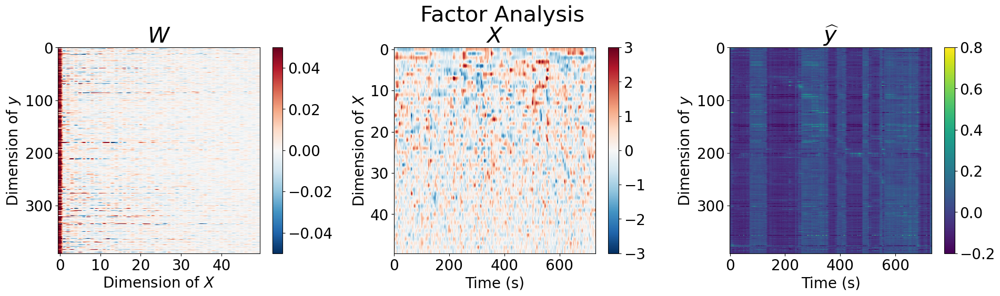

In [12]:
imshow_model_wxyq(result_models,model_name = 'fa', wmax  =0.05, xmax = 3, ymax = ymax, ymin = ymin, cmap ='RdBu_r', 
                  title ='Factor Analysis',figsize = figsize,  savepath = savepath,
                  y_sort_idx=idx_sort,xtick_s = xtick_s)

sort yq


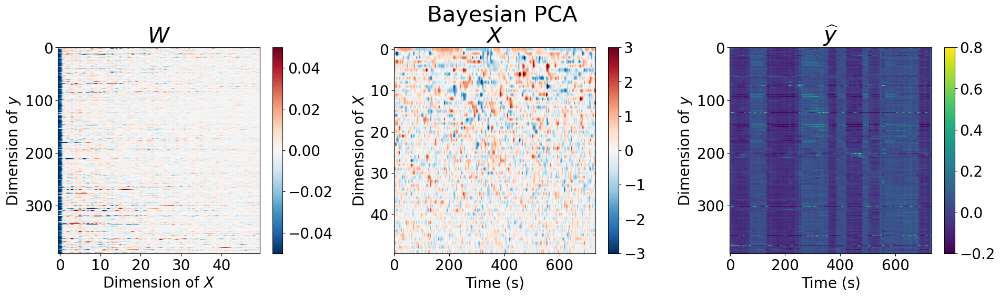

In [13]:
imshow_model_wxyq(result_models,model_name = 'bpca_common', wmax  =0.05, xmax = 3, ymax = ymax, ymin = ymin, cmap ='RdBu_r', 
                  title ='Bayesian PCA',figsize = figsize, savepath = savepath,
                  y_sort_idx=idx_sort,xtick_s = xtick_s)

sort yq


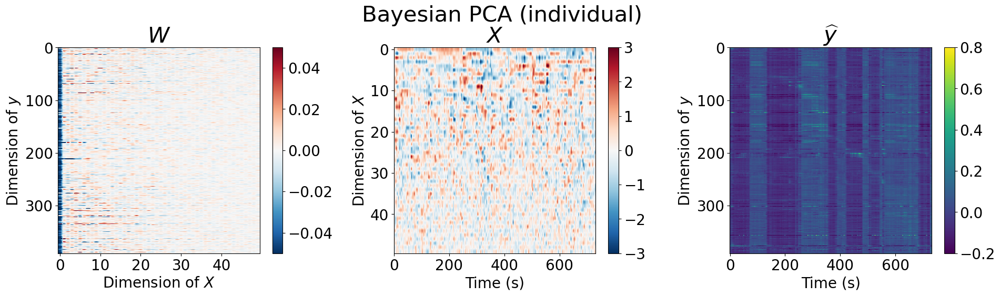

In [14]:
imshow_model_wxyq(result_models,model_name = 'bpca_individual', wmax  =0.05, xmax = 3,  ymax = ymax, ymin = ymin, cmap ='RdBu_r', 
                  title ='Bayesian PCA (individual)',figsize = figsize,  savepath = savepath,
                  y_sort_idx=idx_sort,xtick_s = xtick_s)

sort yq


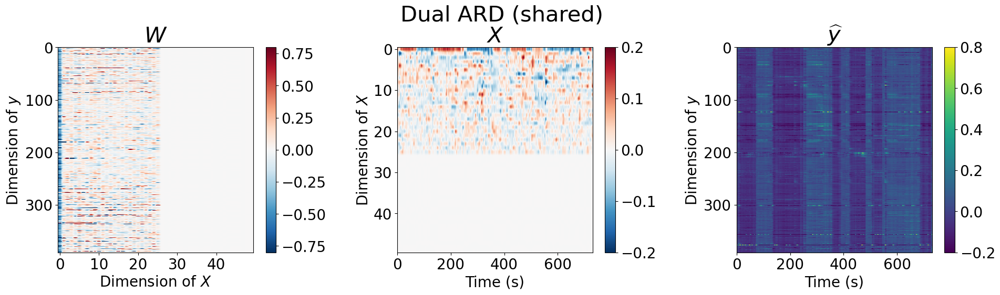

In [15]:
imshow_model_wxyq(result_models,model_name = 'mbpca_common', wmax  =0.8, xmax = 0.2,  ymax = ymax, ymin = ymin, cmap ='RdBu_r', 
                  title ='Dual ARD (shared)',figsize = figsize,  savepath = savepath,
                  y_sort_idx=idx_sort,xtick_s = xtick_s)

sort yq


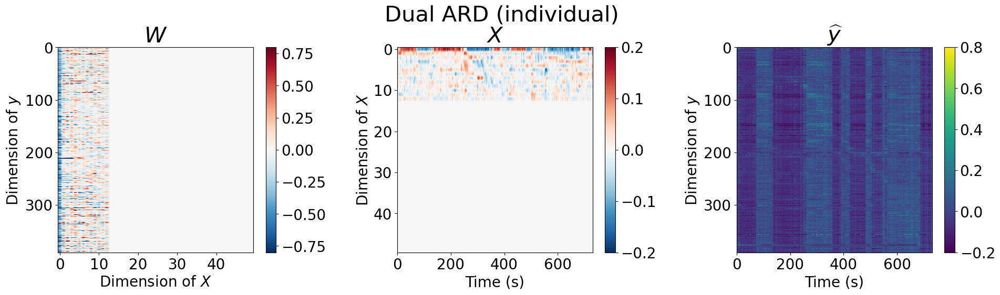

In [16]:
imshow_model_wxyq(result_models,model_name = 'mbpca_individual', wmax  =0.8, xmax = 0.2,  ymax = ymax, ymin = ymin, cmap ='RdBu_r', 
                  title ='Dual ARD (individual)',figsize = figsize,  savepath = savepath,
                  y_sort_idx=idx_sort,xtick_s = xtick_s)

In [17]:
def change_model_name_labels(model_names):
    model_labels = [None]*len(model_names)
    for i in range(len(model_names)):
        # print(i,model_names[i])
        if model_names[i] == 'pca':
            model_labels[i] = 'PCA'
        elif model_names[i] =='mlpca':
            model_labels[i] = 'Probabilistic PCA'
        elif model_names[i] =='fa':
            model_labels[i] = 'Factor analysis'
        elif model_names[i] =='bpca_common':
            model_labels[i] = 'Bayesian PCA'
        elif model_names[i] =='bpca_individual':
            model_labels[i] = 'variant Bayesian PCA '
        elif model_names[i] =='mbpca_common':
            model_labels[i] = 'variant Dual ARD'
        elif model_names[i] =='mbpca_individual':
            model_labels[i] = 'Dual ARD '
    return model_labels



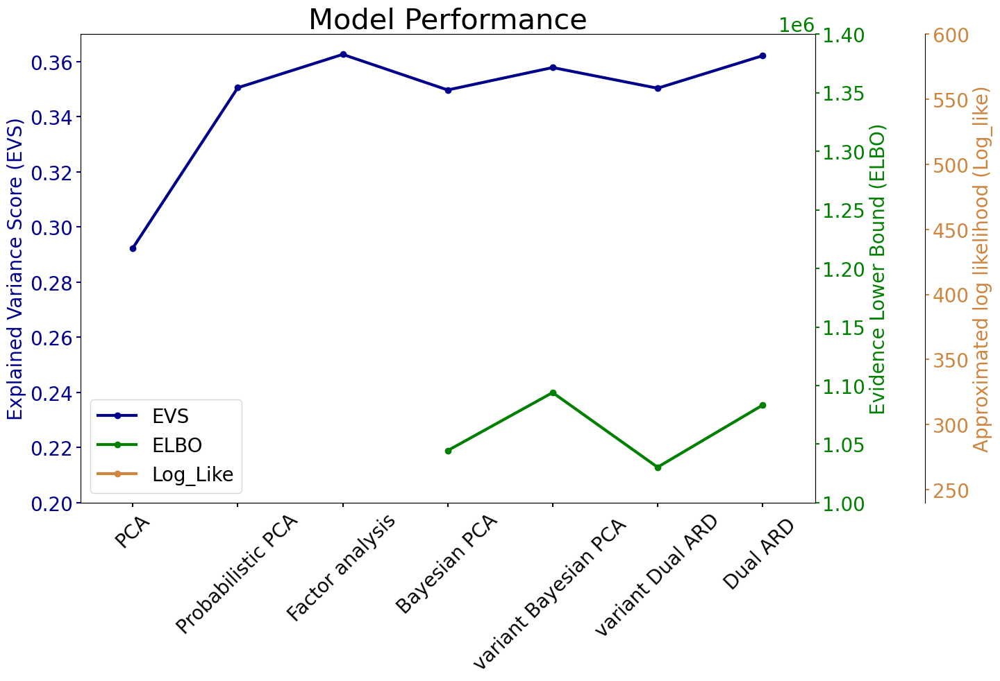

In [18]:
import fun_plots; reload(fun_plots)
from fun_plots import pointplot_3axis
import pandas as pd
scores_models = dict()
model_names = ['pca', 'mlpca', 'fa', 'bpca_common',  'bpca_individual', 'mbpca_common',  'mbpca_individual']
score_names = ['r2', 'evs', 'lb', 'log_like', 'mvds', 'nef']
# score_names = ['r2', 'evs', 'lb', 'log_like']
for model_name in model_names:
    scores_models[model_name] = dict()
    for score_name in score_names:
        
        scores_models[model_name][score_name] = result_models[model_name]['scores'][score_name]


colors =['darkblue','green','peru',]
ylabels =['Explained Variance Score (EVS)',
          'Evidence Lower Bound (ELBO)',
          'Approximated log likelihood (Log_like)']
labels = ['EVS', 'ELBO', 'Log_Like']
df_scores_models = pd.DataFrame(scores_models).T
score1 = np.array(df_scores_models['evs'])
score2 = np.array(df_scores_models['lb'])
score3 = np.array(df_scores_models['log_like'])
nefs = score3 = np.array(df_scores_models['nef'])

ylims = [[0.2, 0.37],[1e6,1.4e6], [240,600]]

model_names = list(scores_models.keys())
x3 = None
# score3 = score3[1:3]
# x3 = np.arange(1,3)
score2 = score2[3:7]
x2 = np.arange(3,7)
title ='Model Performance'
figsize_cm = (7,4.5)
figsize = (figsize_cm[0]*scale*cm2inch,figsize_cm[1]*scale*cm2inch)
xticks = change_model_name_labels(model_names)
pointplot_3axis(score1, score2, score3, 
                x2 = x2, x3 = x3, 
                colors = colors, xticklabels= xticks,
                ylims = ylims,figsize = figsize,
                title = title, 
                ylabels = ylabels, 
                labels = labels,
                legend_loc = 'best',
                savepath = savepath )



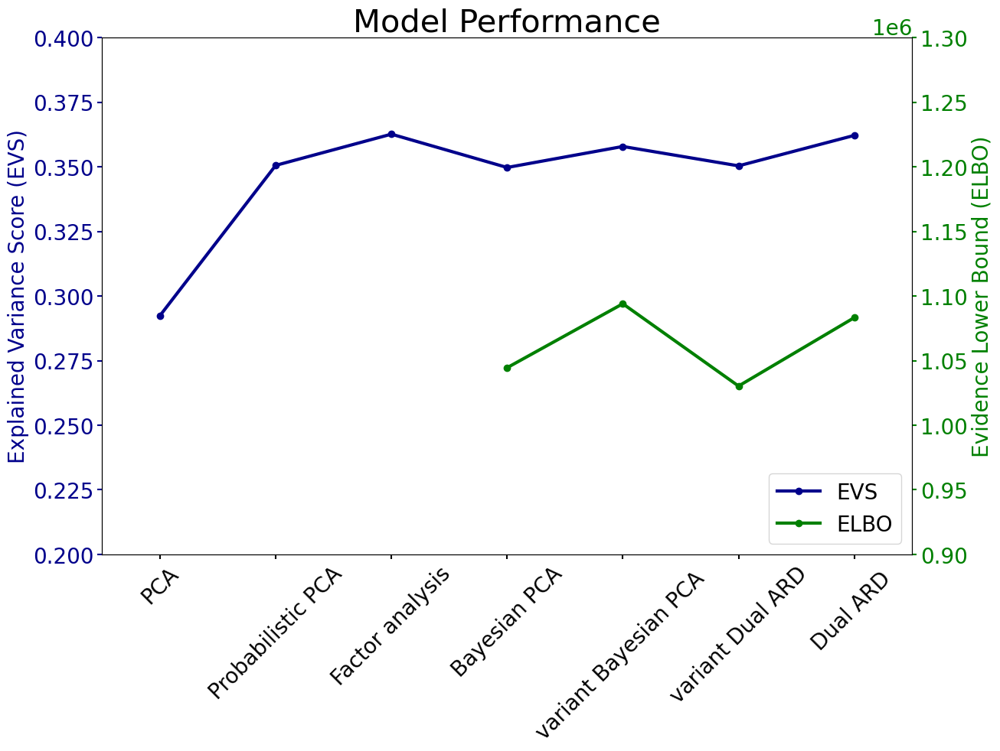

In [19]:
ylims = [[0.2, 0.4],[0.9e6,1.3e6]]
import fun_plots; reload(fun_plots)
from fun_plots import pointplot_2axis_
ylabels =['Explained Variance Score (EVS)',
          'Evidence Lower Bound (ELBO)']
labels = ['EVS', 'ELBO']
pointplot_2axis_(score1, score2, x2 = x2,
                ylims = ylims,figsize = figsize,
                colors = colors, xticklabels= xticks,
                title = title, 
                ylabels = ylabels, 
                labels = labels,
                legend_loc = 'lower right',
                savepath = savepath )

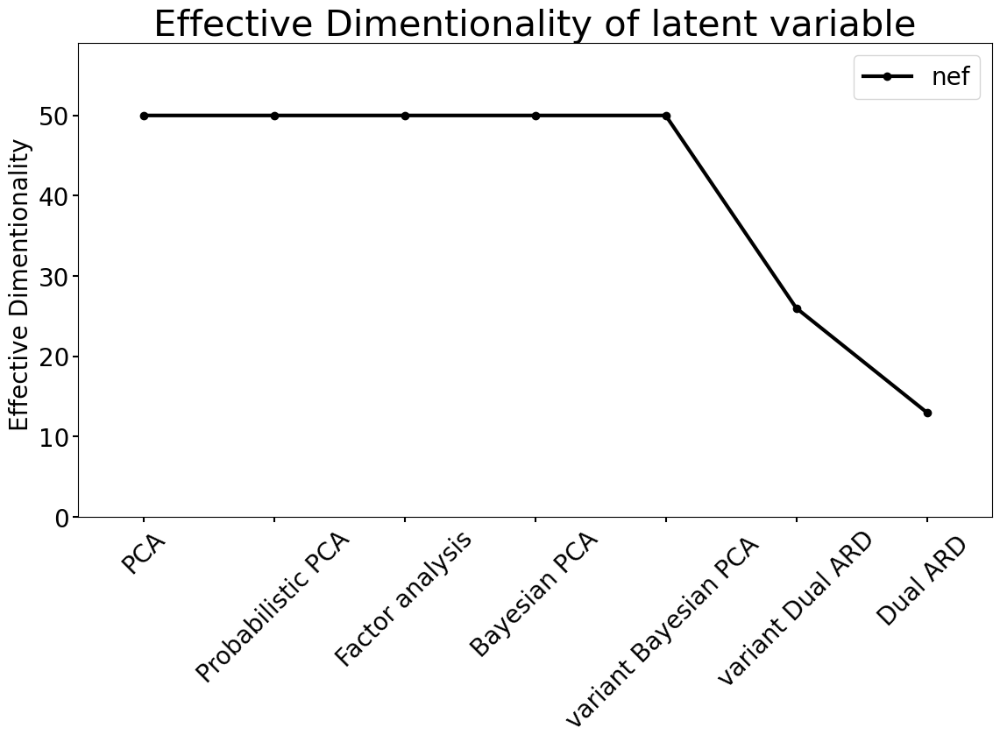

In [20]:
import fun_plots; reload(fun_plots)
from fun_plots import pointplot_1axis
nefs[0] = 50

ylabel = ['Effective Dimentionality ']
colors =['k']
labels = ['nef']
title ='Effective Dimentionality of latent variable'
figsize_cm = (6.9,3.6)
ylim = [[0,59]]
figsize = (figsize_cm[0]*scale*cm2inch,figsize_cm[1]*scale*cm2inch)
pointplot_1axis(nefs, colors = colors, xticklabels= xticks,
                ylims = ylim,
                title = title, 
                ylabels = ylabel, 
                labels = labels,
                legend_loc = 'best',
                savepath = savepath,
                 figsize =  figsize)

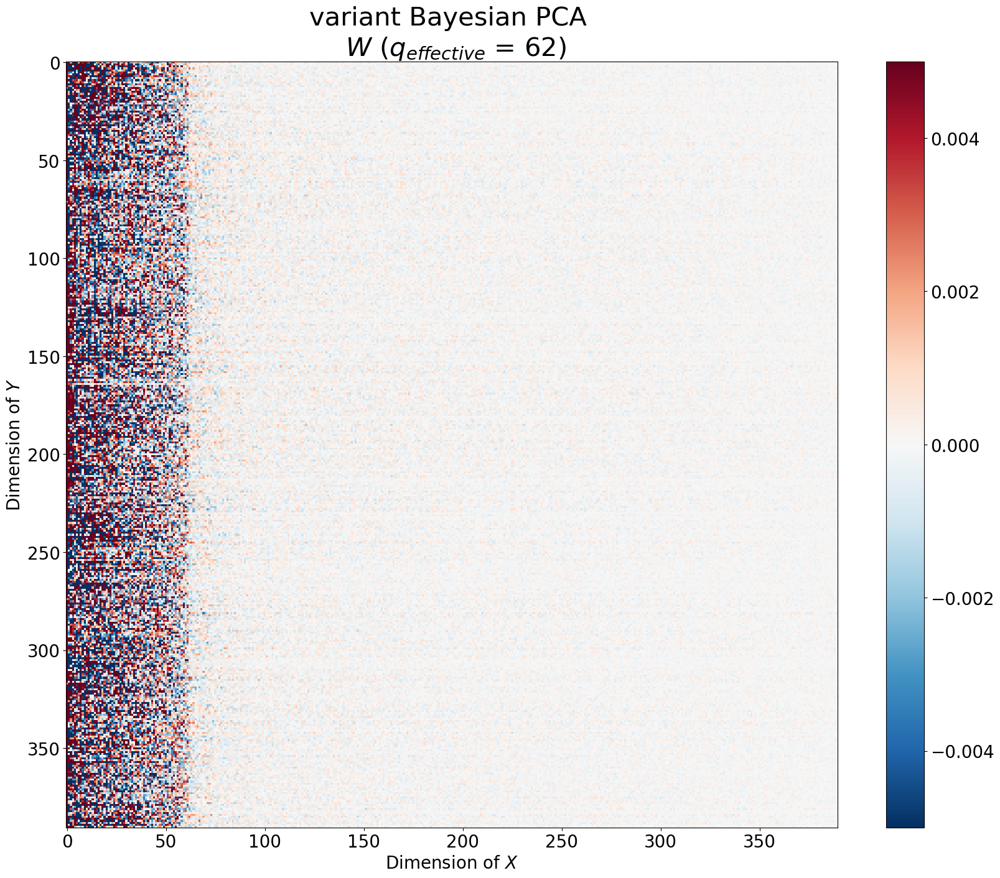

In [21]:

filename ='../data/run_data/piezo_model_D_bpca_individual.pickle'
with open(filename, 'rb') as f:
    result_model_D = pickle.load(f)

model_name = 'bpca_individual'
W_model = result_model_D[model_name]['W']
nef = result_model_D[model_name]['scores']['nef']


fig,ax = plt.subplots(figsize = (20,16) )
fig.set_size_inches(20,16)

cm = ax.imshow(W_model,aspect ='auto',cmap ='RdBu_r', vmin = -0.005, vmax = 0.005)
fig.colorbar(cm, ax= ax)
ax.set_xlabel(r'Dimension of $X$')
ax.set_ylabel(r'Dimension of $Y$')
ax.set_title('variant Bayesian PCA \n'+r' $W$'+r' ($q_{effective}$ = '+str(int(nef))+')', wrap = True) 
plt.show()



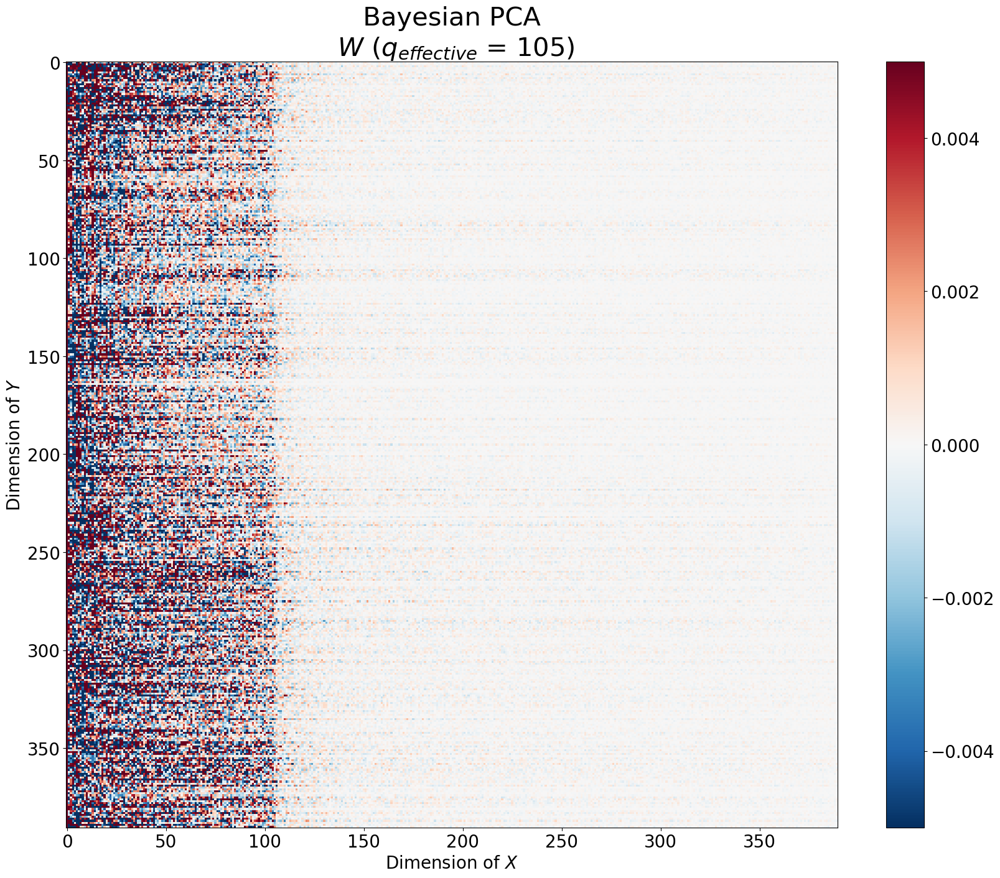

In [22]:
model_name = 'bpca_common'
filename ='../data/run_data/piezo_model_D_'+model_name+'.pickle'
with open(filename, 'rb') as f:
    result_model_D = pickle.load(f)


W_model = result_model_D[model_name]['W']
nef = result_model_D[model_name]['scores']['nef']


fig,ax = plt.subplots( )
fig.set_size_inches((20,16))

cm = ax.imshow(W_model,aspect ='auto',cmap ='RdBu_r', vmin = -0.005, vmax = 0.005)
fig.colorbar(cm, ax= ax)
# plt.colorbar()
ax.set_xlabel(r'Dimension of $X$')
ax.set_ylabel(r'Dimension of $Y$')
ax.set_title(' Bayesian PCA \n'+r' $W$'+r' ($q_{effective}$ = '+str(int(nef))+')', wrap = True) 
plt.show()

